In [1]:
import pandas as pd
import numpy as np
import gensim
from nltk.stem.porter import *
np.random.seed(2018)
from gensim import corpora
import collections
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [2]:
data = pd.read_csv("/GMAT Club2020 MBA forum data.csv")
data

,Topic,Date,Clean_Text
0,2021-22 MBA Deadlines & Essay Topics of Top Sc...,20 May 2020,may michigan ross deadline round due decision ...
1,2021-22 MBA Deadlines & Essay Topics of Top Sc...,20 May 2020,may deadline round deadline interview decision...
2,2021-22 MBA Deadlines & Essay Topics of Top Sc...,28 May 2020,may deadline round deadline decision round rou...
3,2021-22 MBA Deadlines & Essay Topics of Top Sc...,02 Jun 2020,ross deadline round due decision round round m...
4,2021-22 MBA Deadlines & Essay Topics of Top Sc...,04 Jun 2020,deadline deadline early decision rolling final...
...,...,...,...
15441,GMAT Question of the Day - Subscribe for Daily...,25 May 2018,may subscribe question day question mon answer...
15442,GMAT Question of the Day - Subscribe for Daily...,29 May 2018,may thanks bunch another great effort please l...
15443,GMAT Question of the Day - Subscribe for Daily...,31 Jul 2018,love feature
15444,GMAT Question of the Day - Subscribe for Daily...,25 Aug 2019,product negative following must true


In [5]:
data = data.drop_duplicates(subset ="Clean_Text")

In [6]:
data.isnull().sum()

Topic         0
Date          0
Clean_Text    0
dtype: int64

In [5]:
data = data.dropna()

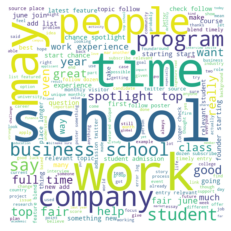

In [34]:
n=2
#cleaned_text = list(data['Clean Text'])
all_text = ' '.join(clean_text)

stopwords = set(STOPWORDS)
#lower max_font_size, change the maximum number of word and lighten the background:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(all_text)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()
#plt.savefig('wordcloud clean.png')

In [37]:
doc_clean = [str(doc).split() for doc in df['Text']] 
dictionary = corpora.Dictionary(doc_clean)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

In [75]:
topic = 5
words=15
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, 
                num_topics=topic, 
                id2word = dictionary, 
                iterations=100,
                per_word_topics=True)
topics = ldamodel.print_topics(num_topics=topic, num_words=words)

In [76]:
topic_list =[]
topic_weight =[]
topics_weight =[]

for row in topics:
    topic_list.append(str(row).split('+'))
for row in topic_list:
    topic_weight.append(re.sub('[^A-Za-z0-9.,''* ]', ' ', str(row)))
for row in topic_weight:
    topics_weight.append(str(row).split(','))

dicts = pd.DataFrame(topics_weight)
dicts = dicts.rename(columns={0: "index"})
dicts = dicts.drop(['index'], axis=1)

i = 1
for col_name in dicts.columns: 
    col_name = 'word'+'_{}'.format(i)
    dicts = dicts.rename(columns={i: col_name})
    i = i + 1

j=1
k=1
for col_name in dicts.columns:
    temp=[]
    for i in range(0,topic):
        temp.append(str(dicts[col_name][i]).split("* ")[0])
        dicts[col_name][i] = str(dicts[col_name][i]).split("* ")[1]
    name = 'score'+'_{}'.format(j)
    j=j+1
    dicts.insert(k,name,temp)
    k = k+2

In [71]:
dicts

,word_1,score_1,word_2,score_2,word_3,score_3,word_4,score_4,word_5,score_5,...,word_11,score_11,word_12,score_12,word_13,score_13,word_14,score_14,word_15,score_15
0,question,0.027,start,0.015,starting,0.015,point,0.015,founder,0.014,...,time,0.012,spotlight,0.012,thanks,0.008,error,0.008,log,0.007
1,student,0.022,site,0.015,business,0.014,free,0.010,find,0.010,...,loan,0.007,group,0.006,monthly,0.006,check,0.006,service,0.006
2,interview,0.034,thanks,0.021,question,0.017,anyone,0.015,got,0.015,...,help,0.009,hello,0.008,chat,0.008,everyone,0.008,may,0.008
3,school,0.011,company,0.009,business,0.009,time,0.007,work,0.007,...,job,0.005,student,0.005,like,0.005,want,0.005,rule,0.005
4,year,0.025,school,0.021,score,0.021,work,0.016,experience,0.013,...,time,0.007,college,0.007,test,0.007,apply,0.006,month,0.006
5,time,0.017,question,0.011,like,0.009,work,0.007,school,0.006,...,test,0.005,good,0.005,really,0.005,lot,0.005,first,0.005
6,topic,0.030,new,0.026,question,0.021,feature,0.016,page,0.015,...,source,0.011,may,0.011,click,0.011,top,0.011,please,0.010


In [77]:
dicts.to_csv("topic 5.csv")

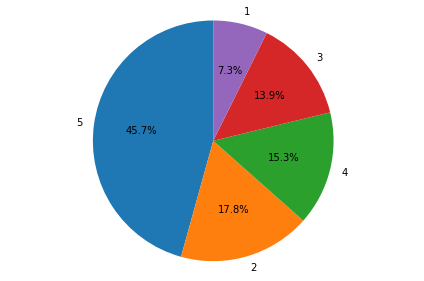

In [79]:
#text = str(text)
#empty = text.count('')
corpus = [dictionary.doc2bow(text) for text in doc_clean]

vector = []
for row in corpus:
    vector.append(ldamodel[row])

rows = []
for row in vector:
    topic_v = []
    rows.append(row[0])
topic_vector = []
for row in rows:
    topic_v = []
    for item in row:
        topic_v.append(item[1])
    topic_vector.append(topic_v)

vector_df = pd.DataFrame(topic_vector)
i = 0
for col_name in vector_df.columns: 
    col_name = 'topic'+'_{}'.format(i+1) + '_weight'
    vector_df = vector_df.rename(columns={i: col_name})
    i = i + 1

data = pd.concat([data, vector_df], axis=1, sort=False)

max_array = []
for row in rows:
    x = -1
    for value in row:
        if x<value[1]:
            x=value[1]
            y=value[0]
    max_array.append((y,x))
max_array = pd.DataFrame(max_array)
max_array = max_array.rename(columns={0: "Topic_Assigned", 1: "Weight"})
data = pd.concat([data, max_array], axis=1, sort=False)
#topic_assigned = data.drop(["data"],axis = 1)

count=collections.Counter(max_array.Topic_Assigned)
count_topic = []
index = []
index_str = []
for x in count:
    index.append(x+1)
    count_topic.append(count[x])
index = pd.DataFrame(index)
index = index.rename(columns={0: "Topic_Number"})
count_topic = pd.DataFrame(count_topic)
count_topic = count_topic.rename(columns={0: "Number_of_tickets"})
count_vector = pd.concat([index, count_topic], axis=1, sort=False)
count_vector = count_vector.sort_values(by=['Topic_Number'])
count_vector = count_vector.reset_index()
count_vector = count_vector.drop(["index"], axis=1)
count_vector['Number_of_tickets'][0] = count_vector['Number_of_tickets'][0]
count_vector = count_vector.sort_values(by=['Number_of_tickets'],ascending =False)

#import matplotlib.pyplot as plt

labels = count_vector.Topic_Number
sizes = count_vector.Number_of_tickets
# Plot
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
     startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.tight_layout()
plt.savefig('C:/Users/saksh/Desktop/MSU/1. Anjana/pie-chart 5.png')


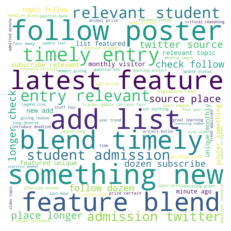

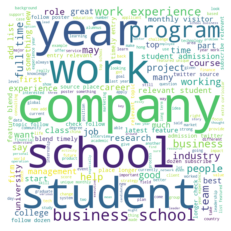

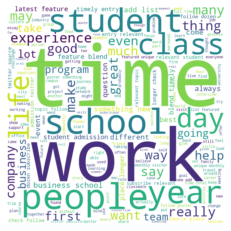

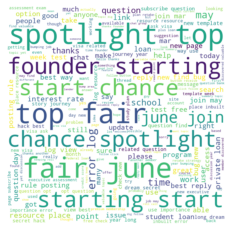

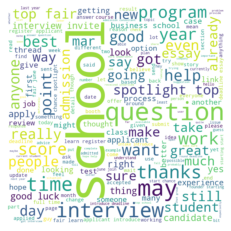

In [80]:
from pandasql import sqldf
pysqldf = lambda q: sqldf(q, globals())
for i in range(topic):
    stri = "\"" + str(i) + "\""
    #print(stri)
    text = []
    df = pysqldf("select Clean_Text from data where Topic_Assigned="+stri)
    #print(df)
    for row in df['Clean_Text']:
        text.append(row)
    #print(text)
    #cleaned_text = list(data['Clean Text'])
    all_text = ' '.join(text)
    #from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
    #stopwords = set(STOPWORDS)
    # lower max_font_size, change the maximum number of word and lighten the background:
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(all_text)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.savefig("worlcloud5_"+str(i)+".png")

In [78]:
#filter stop words
stop = ['mobile','posted','device','club','forum']
cleaned_text = []
def clean(doc):    
    stop_free = " ".join([i for i in str(doc).split() if i not in stop])
    return stop_free
for row in data['Clean Text']:
    #print(row)
    cleaned_row = clean(row)
    cleaned_text.append(cleaned_row)
    #break
clean_text = pd.DataFrame(cleaned_text,columns=["Clean Text"])

In [87]:
data['Clean Text'] = clean_text['Clean Text']

In [74]:
data['Clean Text'][0]

'may michigan ross deadline round due decision round round mar essay question analysis review would like know consider candidacy business school program word count limit analysis essay accepted intake introduce deadline essay'

In [ ]:
#word filtering

In [4]:
import pandas as pd
data = pd.read_csv("2020 MBA forum data.csv")

In [21]:
len(stop)

25

In [5]:
stop = ['club','think','also','post','mobile','device','wrote','see','tag','verbal','would','forum','know','profile','one','get','thank','evaluation',
       'everything','need','tool','posted','kudos','quant',"well"]

In [6]:
clean_text = []
for row in data['Clean Text']:
    stop_free = " ".join([i for i in str(row).split() if i not in stop])
    clean_text.append(stop_free)

In [7]:
len(clean_text)

21912

In [8]:
df = pd.DataFrame(clean_text,columns=['Text'])

In [9]:
data['Clean_Text'] = df['Text']


In [11]:
data.to_csv("2020 MBA forum data.csv")

In [7]:
#word frequency
cleaned_text = list(data['Clean_Text'])
sep = ' '
all_text = sep.join(cleaned_text)
all_text = all_text.split()
all_text

['may',
 'michigan',
 'ross',
 'deadline',
 'round',
 'due',
 'decision',
 'round',
 'round',
 'mar',
 'essay',
 'question',
 'analysis',
 'review',
 'like',
 'consider',
 'candidacy',
 'business',
 'school',
 'program',
 'word',
 'count',
 'limit',
 'analysis',
 'essay',
 'accepted',
 'intake',
 'introduce',
 'deadline',
 'essay',
 'may',
 'deadline',
 'round',
 'deadline',
 'interview',
 'decision',
 'round',
 'round',
 'mar',
 'round',
 'mar',
 'may',
 'essay',
 'first',
 'time',
 'applicant',
 'applicant',
 'complete',
 'essay',
 'admission',
 'committee',
 'want',
 'personal',
 'level',
 'encourage',
 'candid',
 'succinct',
 'suggest',
 'additional',
 'essay',
 'writing',
 'resource',
 'essay',
 'tip',
 'article',
 'essay',
 'hope',
 'gain',
 'word',
 'essay',
 'taking',
 'background',
 'personal',
 'academic',
 'plan',
 'make',
 'specific',
 'meaningful',
 'community',
 'word',
 'essay',
 'please',
 'use',
 'space',
 'share',
 'admission',
 'committee',
 'reflected',
 'grown',
 '

In [8]:
from nltk import ngrams, FreqDist
all_counts = FreqDist(ngrams(all_text, 2))

In [10]:
ngram_list = []
freq = []
for k,v in all_counts.items():
    ngram_list.append(k)
    freq.append(v)
ngram_list = pd.DataFrame(ngram_list,columns=["Word1","Word2"])
freq = pd.DataFrame(freq,columns=["Frequency"])
Ngram = pd.concat([ngram_list, freq], axis=1, sort=False)
result = Ngram.sort_values(by=['Frequency'], ascending=False)
result

,Word1,Word2,Frequency
17,business,school,1981
105,work,experience,1460
293,full,time,1396
12865,something,new,1391
23630,add,list,1364
...,...,...,...
173546,message,feeding,1
173547,feeding,point,1
173548,point,reliable,1
173549,reliable,selection,1


In [11]:
result.to_csv("Bigram.csv")

In [16]:
#count vector
from sklearn.feature_extraction.text import CountVectorizer
vec = CountVectorizer()
X = vec.fit_transform(list(data['Clean_Text']))
df1 = pd.DataFrame(X.toarray(), columns=vec.get_feature_names())
print(df1)

       aam  aback  abacus  abandoned  abb  abbey  abdicate  aberrant  abide  \
0        0      0       0          0    0      0         0         0      0   
1        0      0       0          0    0      0         0         0      0   
2        0      0       0          0    0      0         0         0      0   
3        0      0       0          0    0      0         0         0      0   
4        0      0       0          0    0      0         0         0      0   
...    ...    ...     ...        ...  ...    ...       ...       ...    ...   
15441    0      0       0          0    0      0         0         0      0   
15442    0      0       0          0    0      0         0         0      0   
15443    0      0       0          0    0      0         0         0      0   
15444    0      0       0          0    0      0         0         0      0   
15445    0      0       0          0    0      0         0         0      0   

       ability  ...  zimbabwe  zinc  zip  zipper  z

In [17]:
df1.to_csv("GMAT Club count vector.csv")

In [18]:
transaction = []
for row in data['Clean Text']:
    text = str(row).split()
    transaction.append(text)

In [19]:
transaction

[['may',
  'michigan',
  'ross',
  'deadline',
  'round',
  'due',
  'decision',
  'round',
  'round',
  'mar',
  'essay',
  'question',
  'analysis',
  'review',
  'would',
  'like',
  'know',
  'consider',
  'candidacy',
  'business',
  'school',
  'program',
  'word',
  'count',
  'limit',
  'analysis',
  'essay',
  'accepted',
  'intake',
  'introduce',
  'deadline',
  'essay'],
 ['may',
  'deadline',
  'round',
  'deadline',
  'interview',
  'decision',
  'round',
  'round',
  'mar',
  'round',
  'mar',
  'may',
  'essay',
  'first',
  'time',
  'applicant',
  'applicant',
  'complete',
  'essay',
  'admission',
  'committee',
  'want',
  'get',
  'know',
  'personal',
  'level',
  'encourage',
  'candid',
  'succinct',
  'suggest',
  'additional',
  'essay',
  'writing',
  'resource',
  'see',
  'essay',
  'tip',
  'article',
  'essay',
  'hope',
  'gain',
  'word',
  'essay',
  'taking',
  'background',
  'personal',
  'academic',
  'plan',
  'make',
  'specific',
  'meaningful'

In [20]:
df2 = pd.DataFrame(transaction)
df2

,0,1,2,3,4,5,6,7,8,9,...,1623,1624,1625,1626,1627,1628,1629,1630,1631,1632
0,may,michigan,ross,deadline,round,due,decision,round,round,mar,...,None,None,None,None,None,None,None,None,None,None
1,may,deadline,round,deadline,interview,decision,round,round,mar,round,...,None,None,None,None,None,None,None,None,None,None
2,may,deadline,round,deadline,decision,round,round,round,may,essay,...,None,None,None,None,None,None,None,None,None,None
3,ross,deadline,round,due,decision,round,round,mar,round,mar,...,None,None,None,None,None,None,None,None,None,None
4,deadline,deadline,early,decision,rolling,final,regular,decision,rolling,essay,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21907,may,subscribe,question,day,quant,verbal,question,mon,answer,included,...,None,None,None,None,None,None,None,None,None,None
21908,may,thanks,bunch,another,great,effort,please,let,know,going,...,None,None,None,None,None,None,None,None,None,None
21909,love,feature,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
21910,product,negative,following,must,true,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [27]:
maxwords = 0
for i in range(len(transaction)):
    length = len(transaction[i])
    if maxwords < length:
        maxwords = length
    #break

In [28]:
maxwords

1633

In [30]:
df2[0]

0             may
1             may
2             may
3            ross
4        deadline
           ...   
21907         may
21908         may
21909        love
21910     product
21911       wrote
Name: 0, Length: 21912, dtype: object

In [32]:
df2.to_csv("transaction table.csv")

In [33]:
transaction.to_csv("comma seperated.csv")

AttributeError: 'list' object has no attribute 'to_csv'

# clustering

In [147]:
df_tfidf = pd.read_csv("tfidf.csv")

In [148]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [149]:
# PCA
def pca(df):
    pca = PCA(n_components=2)
    pca.fit(df)
    pca_samples = pca.transform(df)
    new_df = pd.DataFrame(pca_samples)
    
    no_clusters = list(range(1,20))
    sse = []
    for n in no_clusters:
        clusterer = KMeans(n_clusters=n,random_state=42).fit(new_df)
        sse.append(clusterer.inertia_)

    plt.figure(figsize=(6, 6))
    plt.plot(no_clusters, sse, '-o')
    plt.xlabel(r'Number of clusters 20')
    plt.ylabel('Sum of squared distance')
    plt.show()
    
    #num = []
    #diff = 1
    #i = 0
    #while diff > 0.05:
     #   diff = (sse[i]-sse[i+1]) / sse[i]
      #  i = i + 1
    #num = i
                
    return new_df #,num

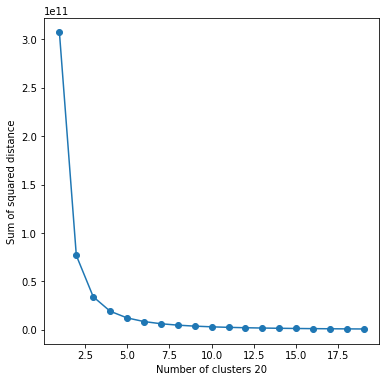

In [150]:
pca_df = pca(df_tfidf)

In [151]:
def plot_cluster(df,n):    
    clusterer = KMeans(n_clusters=n,random_state=42).fit(df)
    centers = clusterer.cluster_centers_
    c_preds = clusterer.predict(df)
    fig = plt.figure(figsize=(8,8))
    colors = ['orange','blue','purple','green','red']
    colored = [colors[k] for k in c_preds]
    plt.scatter(df[0],df[1],  color = colored)
    for ci,c in enumerate(centers):
        plt.plot(c[0], c[1], 'o', markersize=8, color='black', alpha=0.9, label=''+str(ci))

    plt.xlabel('x_values')
    plt.ylabel('y_values')
    plt.legend()
    plt.show()
    
    return c_preds

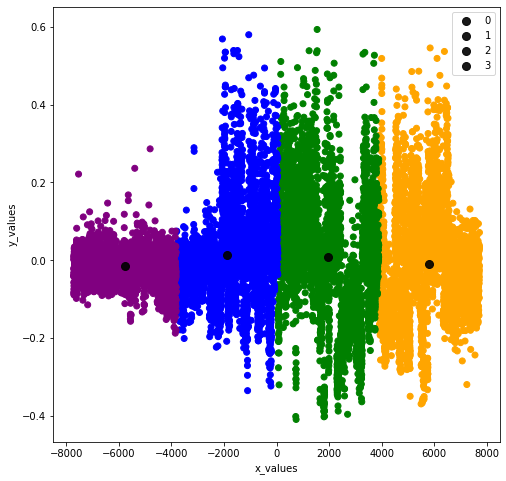

In [152]:
pred = plot_cluster(pca_df,4)

In [57]:
len(pred)

15446

In [153]:
clusters = pd.DataFrame(pred,columns=['Cluster'])
clusters

,Cluster
0,0
1,0
2,0
3,0
4,0
...,...
15441,2
15442,2
15443,2
15444,2


In [154]:
clusters = pd.DataFrame(pred,columns=['Cluster'])
data['Cluster'] = clusters['Cluster']
data

,Topic,Date,Clean_Text,Cluster
0,2021-22 MBA Deadlines & Essay Topics of Top Sc...,20 May 2020,may michigan ross deadline round due decision ...,0
1,2021-22 MBA Deadlines & Essay Topics of Top Sc...,20 May 2020,may deadline round deadline interview decision...,0
2,2021-22 MBA Deadlines & Essay Topics of Top Sc...,28 May 2020,may deadline round deadline decision round rou...,0
3,2021-22 MBA Deadlines & Essay Topics of Top Sc...,02 Jun 2020,ross deadline round due decision round round m...,0
4,2021-22 MBA Deadlines & Essay Topics of Top Sc...,04 Jun 2020,deadline deadline early decision rolling final...,0
...,...,...,...,...
15441,GMAT Question of the Day - Subscribe for Daily...,25 May 2018,may subscribe question day question mon answer...,2
15442,GMAT Question of the Day - Subscribe for Daily...,29 May 2018,may thanks bunch another great effort please l...,2
15443,GMAT Question of the Day - Subscribe for Daily...,31 Jul 2018,love feature,2
15444,GMAT Question of the Day - Subscribe for Daily...,25 Aug 2019,product negative following must true,2


In [155]:
data['Cluster'].value_counts()

2    3905
1    3870
3    3839
0    3832
Name: Cluster, dtype: int64

In [33]:
data.to_csv("Topic modelling using tfidf clustering.csv")

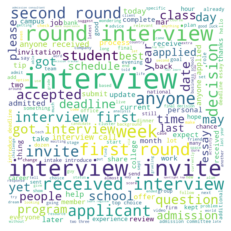

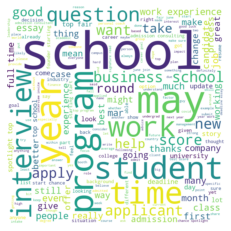

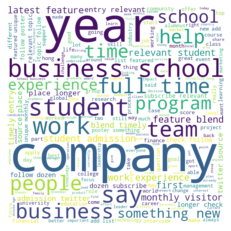

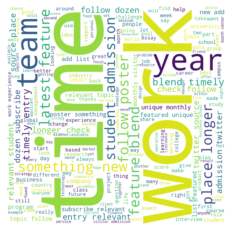

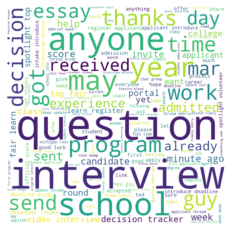

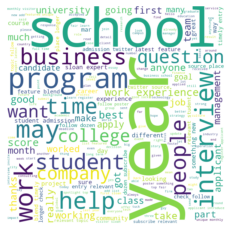

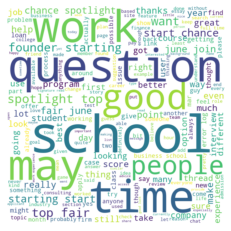

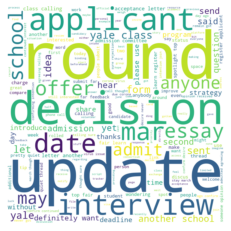

In [71]:
from pandasql import sqldf
stopwords = set(STOPWORDS)
pysqldf = lambda q: sqldf(q, globals())
for i in range(-1,7):
    text = []
    stri = "\"" + str(i) + "\""
    df = pysqldf("select Clean_Text from data where Cluster="+stri)
    for row in df['Clean_Text']:
        text.append(row)
    all_text = " ".join(text)
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(all_text)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.savefig("cluster_"+str(i)+".png")

In [144]:
#word frequency
i=-1
#text = []
stri = "\"" + str(i) + "\""
df = pysqldf("select Clean_Text from data where Cluster="+stri)
text = df['Clean_Text']
cleaned_text = list(text)
sep = ' '
alltext = sep.join(cleaned_text)
alltext = alltext.split()
all_counts = FreqDist(ngrams(alltext, 1))
all_counts
#all_text
#data

PandaSQLException: (sqlite3.OperationalError) no such column: Cluster
[SQL: select Clean_Text from data where Cluster="-1"]
(Background on this error at: http://sqlalche.me/e/e3q8)

In [143]:
ngram_list = []
freq = []
for k,v in all_counts.items():
    ngram_list.append(k)
    freq.append(v)
ngram_list = pd.DataFrame(ngram_list,columns=["Word"])
freq = pd.DataFrame(freq,columns=["Frequency"])
Ngram = pd.concat([ngram_list, freq], axis=1, sort=False)
result = Ngram.sort_values(by=['Frequency'], ascending=False)
result

,Word,Frequency
4,round,24
24,update,23
25,applicant,20
30,decision,18
170,school,17
...,...,...
28,night,1
26,virtual,1
19,stern,1
12,guy,1


# TF-IDF

In [18]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
X = tfidf.fit_transform(list(data['Clean_Text']))
df = pd.DataFrame(X.toarray(), columns=tfidf.get_feature_names())
print(df)

       aam  aback  abacus  abandoned  abb  abbey  abdicate  aberrant  abide  \
0      0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
1      0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
2      0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
3      0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
4      0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
...    ...    ...     ...        ...  ...    ...       ...       ...    ...   
15441  0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
15442  0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
15443  0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
15444  0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   
15445  0.0    0.0     0.0        0.0  0.0    0.0       0.0       0.0    0.0   

       ability  ...  zimbabwe  zinc  zip  zipper  z

In [19]:
df.to_csv("tfidf.csv")

## clustering using density based algorithms

In [36]:
import hdbscan

In [156]:
def plot_cluster(df):    
    clusterer = hdbscan.HDBSCAN(min_cluster_size=5).fit(df)#KMeans(n_clusters=n,random_state=42).fit(df)
    #centers = clusterer.cluster_centers_
    c_preds = clusterer.labels_
    fig = plt.figure(figsize=(8,8))
    colors = ['orange','blue','purple','green','red','black','yellow','green','pink']
    colored = [colors[k] for k in c_preds]
    plt.scatter(df[0],df[1],  color = colored)
    #for ci,c in enumerate(centers):
       # plt.plot(c[0], c[1], 'o', markersize=8, color='black', alpha=0.9, label=''+str(ci))

    plt.xlabel('x_values')
    plt.ylabel('y_values')
    plt.legend()
    plt.show()
    
    return c_preds#clusterer = hdbscan.HDBSCAN(min_cluster_size=5).fit(pca_df)
#clusterer
#clusterer()

No handles with labels found to put in legend.


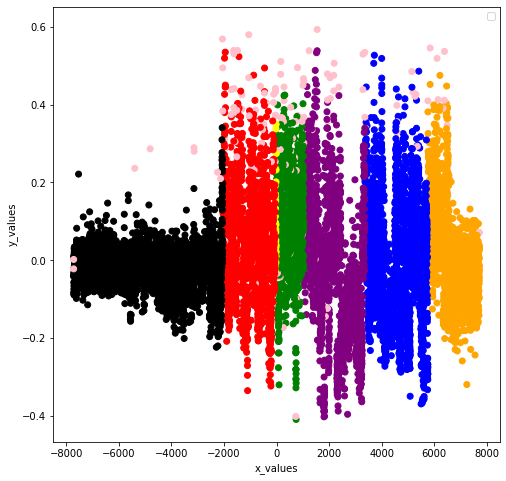

In [157]:
pred = plot_cluster(pca_df)

In [158]:
clusters = pd.DataFrame(pred,columns=['Cluster'])
data['Cluster'] = clusters['Cluster']
data

,Topic,Date,Clean_Text,Cluster
0,2021-22 MBA Deadlines & Essay Topics of Top Sc...,20 May 2020,may michigan ross deadline round due decision ...,-1
1,2021-22 MBA Deadlines & Essay Topics of Top Sc...,20 May 2020,may deadline round deadline interview decision...,-1
2,2021-22 MBA Deadlines & Essay Topics of Top Sc...,28 May 2020,may deadline round deadline decision round rou...,0
3,2021-22 MBA Deadlines & Essay Topics of Top Sc...,02 Jun 2020,ross deadline round due decision round round m...,0
4,2021-22 MBA Deadlines & Essay Topics of Top Sc...,04 Jun 2020,deadline deadline early decision rolling final...,0
...,...,...,...,...
15441,GMAT Question of the Day - Subscribe for Daily...,25 May 2018,may subscribe question day question mon answer...,5
15442,GMAT Question of the Day - Subscribe for Daily...,29 May 2018,may thanks bunch another great effort please l...,5
15443,GMAT Question of the Day - Subscribe for Daily...,31 Jul 2018,love feature,5
15444,GMAT Question of the Day - Subscribe for Daily...,25 Aug 2019,product negative following must true,-1


In [159]:
data['Cluster'].value_counts()

 5    5664
 1    2389
 2    2300
 0    1954
 4    1951
 7     534
 3     485
-1     134
 6      35
Name: Cluster, dtype: int64

In [160]:
data.to_csv("Topic modelling using density clustering.csv")

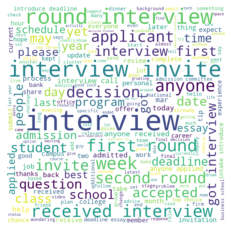

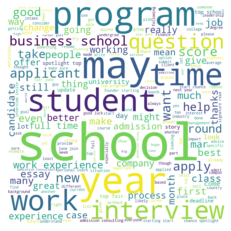

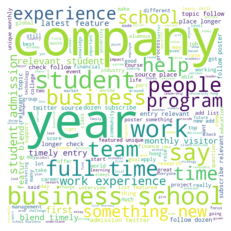

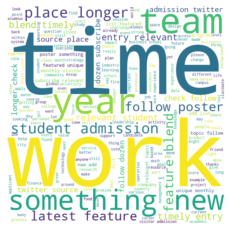

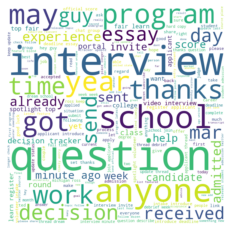

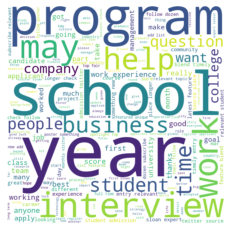

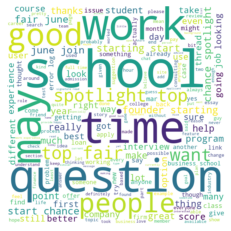

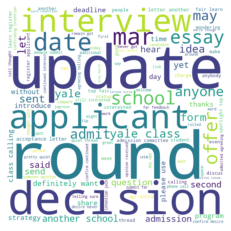

In [161]:
from pandasql import sqldf
stopwords = set(STOPWORDS)
pysqldf = lambda q: sqldf(q, globals())
for i in range(-1,7):
    text = []
    stri = "\"" + str(i) + "\""
    df = pysqldf("select Clean_Text from data where Cluster="+stri)
    for row in df['Clean_Text']:
        text.append(row)
    all_text = " ".join(text)
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(all_text)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.savefig("cluster_"+str(i)+".png")

In [222]:
#word frequency
i=7
#text = []
stri = "\"" + str(i) + "\""
df = pysqldf("select Clean_Text from data where Cluster="+stri)
text = df['Clean_Text']
cleaned_text = list(text)
sep = ' '
alltext = sep.join(cleaned_text)
alltext = alltext.split()
all_counts = FreqDist(ngrams(alltext, 1))
all_counts

FreqDist({('interview',): 411, ('year',): 194, ('question',): 194, ('time',): 158, ('admission',): 155, ('essay',): 154, ('day',): 153, ('business',): 151, ('program',): 151, ('round',): 148, ...})

In [223]:
ngram_list = []
freq = []
for k,v in all_counts.items():
    ngram_list.append(k)
    freq.append(v)
ngram_list = pd.DataFrame(ngram_list,columns=["Word"])
freq = pd.DataFrame(freq,columns=["Frequency"])
Ngram = pd.concat([ngram_list, freq], axis=1, sort=False)
result = Ngram.sort_values(by=['Frequency'], ascending=False)
df8 = result

In [228]:
df0.to_csv("wordfreq0.csv")
df1.to_csv("wordfreq1.csv")
df2.to_csv("wordfreq2.csv")
df3.to_csv("wordfreq3.csv")
df4.to_csv("wordfreq4.csv")
df5.to_csv("wordfreq5.csv")
df6.to_csv("wordfreq6.csv")
df7.to_csv("wordfreq7.csv")
df8.to_csv("wordfreq8.csv")

# Word Embedding

In [7]:
cleaned_text = list(data['Clean_Text'])
sep = ' '
all_text = sep.join(cleaned_text)
all_text

'may michigan ross deadline round due decision round round mar essay question analysis review like consider candidacy business school program word count limit analysis essay accepted intake introduce deadline essay may deadline round deadline interview decision round round mar round mar may essay first time applicant applicant complete essay admission committee want personal level encourage candid succinct suggest additional essay writing resource essay tip article essay hope gain word essay taking background personal academic plan make specific meaningful community word essay please use space share admission committee reflected grown since previous discus relevant update candidacy change life additional volunteer word optional essay please use space share additional cannot found elsewhere like share admission committee space used address gap work experience choice academic area weakness like admission committee consider analysis ross essay intake introduce deadline essay may deadline 

In [27]:
all_words = all_text.split(' ')
all_words = set(all_words)
len(all_words)

11738

In [8]:
import nltk
#cleaned_text = list(data['Clean_Text'])
all_sentences = nltk.sent_tokenize(all_text)
all_words = [nltk.word_tokenize(sent) for sent in all_sentences]
from gensim.models import Word2Vec
model = Word2Vec(all_words)

In [9]:
vocabulary = model.wv.vocab
print(vocabulary)

{'may': <gensim.models.keyedvectors.Vocab object at 0x00000261C2398FC8>, 'michigan': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46CC8>, 'ross': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46D48>, 'deadline': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46D88>, 'round': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46E08>, 'due': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46E88>, 'decision': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46EC8>, 'mar': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46F08>, 'essay': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46DC8>, 'question': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46E48>, 'analysis': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46F48>, 'review': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46F88>, 'like': <gensim.models.keyedvectors.Vocab object at 0x00000261C8B46FC8>, 'consider': <gensim.models.ke

In [96]:
print(model)

Word2Vec(vocab=6310, size=100, alpha=0.025)


In [131]:
print(model.wv.most_similar('covid'))

[('working', 0.45016372203826904), ('green', 0.44706058502197266), ('candidate', 0.43856361508369446), ('personal', 0.4312862157821655), ('booth', 0.4310498833656311), ('make', 0.43103036284446716), ('chance', 0.4299665093421936), ('expert', 0.427957683801651), ('score', 0.4272441565990448), ('impact', 0.42518362402915955)]


In [112]:
print(model.wv.most_similar('program'))

[('school', 0.9300469160079956), ('essay', 0.9268571734428406), ('may', 0.9246723651885986), ('work', 0.9211302995681763), ('interview', 0.9185730218887329), ('job', 0.9181515574455261), ('like', 0.9165830612182617), ('top', 0.9165506362915039), ('applicant', 0.9146589040756226), ('score', 0.9131874442100525)]


In [114]:
X = model[model.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)

C:\Users\saksh\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


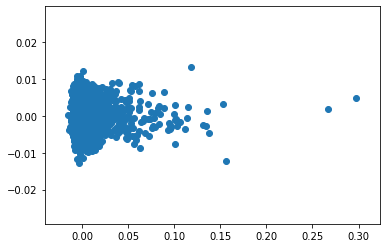

In [117]:
import matplotlib.pyplot as pyplot
pyplot.scatter(result[:, 0], result[:, 1])

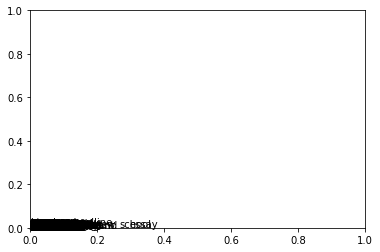

In [119]:
words = list(model.wv.vocab)
for i, word in enumerate(words):
	pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

## GloVe

In [124]:
text_file = open("text.txt", "wt")
n = text_file.write(all_text)
text_file.close()

model.save('model.bin')
#model = Word2Vec.load_word2vec_format('path/to/GoogleNews-vectors-negative300.bin', binary=True)
model.wv.save_word2vec_format('model.txt', binary=False)

In [126]:
from gensim.scripts.glove2word2vec import glove2word2vec
glove_input_file = 'text.txt'
word2vec_output_file = 'model.txt'
glovemodel = glove2word2vec(glove_input_file, word2vec_output_file)

In [129]:
from gensim.models.keyedvectors import KeyedVectors
glovemodel.save('glovemodel.bin')
model1 = KeyedVectors.load_word2vec_format('glovemodel.bin', binary=True)
model1.save_word2vec_format('glovemodel.txt', binary=False)

AttributeError: 'tuple' object has no attribute 'save'

In [229]:
glovemodel.most_similar('covid')

AttributeError: 'tuple' object has no attribute 'most_similar'

# t-SNE visualization

In [75]:
words = ["covid","corona","virus","pandemic","admission","immigrant","immigrate","admit","job","risk","risky",
          "economy","economic","economical","roi","defer","deferment","deferral","deferred","visa","opt",
         "canada","domestic","foreign","extend","extended","extending","gap",
         "abroad","delay","delaying"] #"foreigner","austral",

embedding_clusters = []
word_clusters = []
for word in words:
    embeddings = []
    words1 = []
    for similar_word, _ in model.wv.most_similar(word, topn=30):
        words1.append(similar_word)
        embeddings.append(model[similar_word])
    embedding_clusters.append(embeddings)
    word_clusters.append(words1)


C:\Users\saksh\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  del sys.path[0]


In [76]:
word_array = np.array(word_clusters)
word_array = word_array.T
word_clusters = word_array.tolist()

In [77]:
word_cluster = pd.DataFrame(word_clusters,columns=words)
word_cluster

,covid,corona,virus,pandemic,admission,immigrant,immigrate,admit,job,risk,...,canada,domestic,foreign,extend,extended,extending,gap,abroad,delay,delaying
0,resume,glad,string,hasan,school,since,rapid,hour,school,consulting,...,level,hope,publicity,dear,reality,endurance,piece,user,sparked,fiscal
1,dream,prevention,employee,wright,essay,working,congress,point,essay,question,...,woman,future,anyway,nearly,adaptable,cocoa,tuft,wherein,mass,outbreak
2,first,nancy,safari,wrong,work,personal,heart,long,may,even,...,much,tribal,lived,entirely,stated,gig,trustee,progress,median,hide
3,answer,birthday,relatable,plot,applicant,want,south,done,work,card,...,mean,life,detection,adequately,financial,bullet,thoughtful,terrifying,often,veteran
4,look,scary,weighing,muscle,experience,consulting,insurer,much,applicant,working,...,understand,people,recruiter,pap,presence,impossible,hip,surface,cole,dead
5,top,guarantee,donate,effective,year,looking,acting,want,year,make,...,applicant,detail,automatic,entity,save,emirate,exhaust,onset,apparel,relax
6,mock,intention,picture,historic,goal,even,ripe,time,experience,work,...,want,video,poverty,fee,merger,innovation,two,rare,error,send
7,name,diagnosis,emotional,predict,job,card,stability,interview,opt,part,...,school,share,sweater,intention,covid,pure,fruition,save,reliance,social
8,help,direct,inflation,thousand,may,good,describe,understand,good,personal,...,made,number,volunteer,weighting,talking,entrance,consulate,staircase,color,pull
9,applicant,wound,sent,rainbow,good,apply,excellency,business,goal,green,...,process,put,practiced,reference,explaining,qualified,controller,trillion,study,distribute


In [64]:
word_cluster.to_csv("Similar words.csv",index=False)

In [78]:
from sklearn.manifold import TSNE
import numpy as np

embedding_clusters = np.array(embedding_clusters)
n, m, k = embedding_clusters.shape
tsne_model_en_2d = TSNE(perplexity=15, n_components=2, init='pca', n_iter=3500, random_state=32)
embeddings_en_2d = np.array(tsne_model_en_2d.fit_transform(embedding_clusters.reshape(n * m, k))).reshape(n, m, 2)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


IndexError: index 30 is out of bounds for axis 0 with size 30

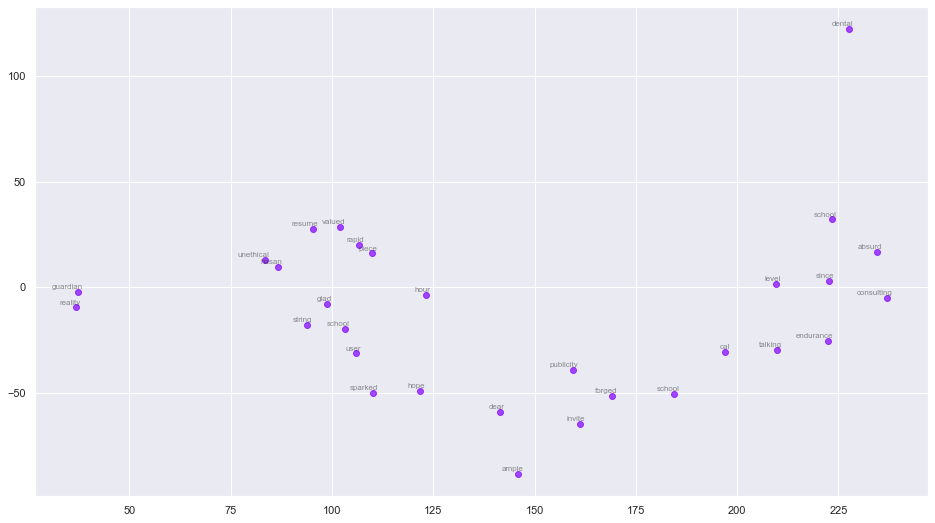

In [79]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
#% matplotlib inline


def tsne_plot_similar_words(title, labels, embedding_clusters, word_clusters, a, filename=None):
    plt.figure(figsize=(16, 9))
    colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    for label, embeddings, words, color in zip(labels, embedding_clusters, word_clusters, colors):
        x = embeddings[:, 0]
        y = embeddings[:, 1]
        plt.scatter(x, y, c=color, alpha=a, label=label)
        for i, word in enumerate(words):
            plt.annotate(word, alpha=0.5, xy=(x[i], y[i]), xytext=(5, 2),
                         textcoords='offset points', ha='right', va='bottom', size=8)
    plt.legend(loc=4)
    plt.title(title)
    plt.grid(True)
    #if filename:
     #   plt.savefig(filename, format='png', dpi=150, bbox_inches='tight')
    plt.show()


tsne_plot_similar_words('Similar words', words, embeddings_en_2d, word_clusters, 0.7,
                        'similar_words.png')

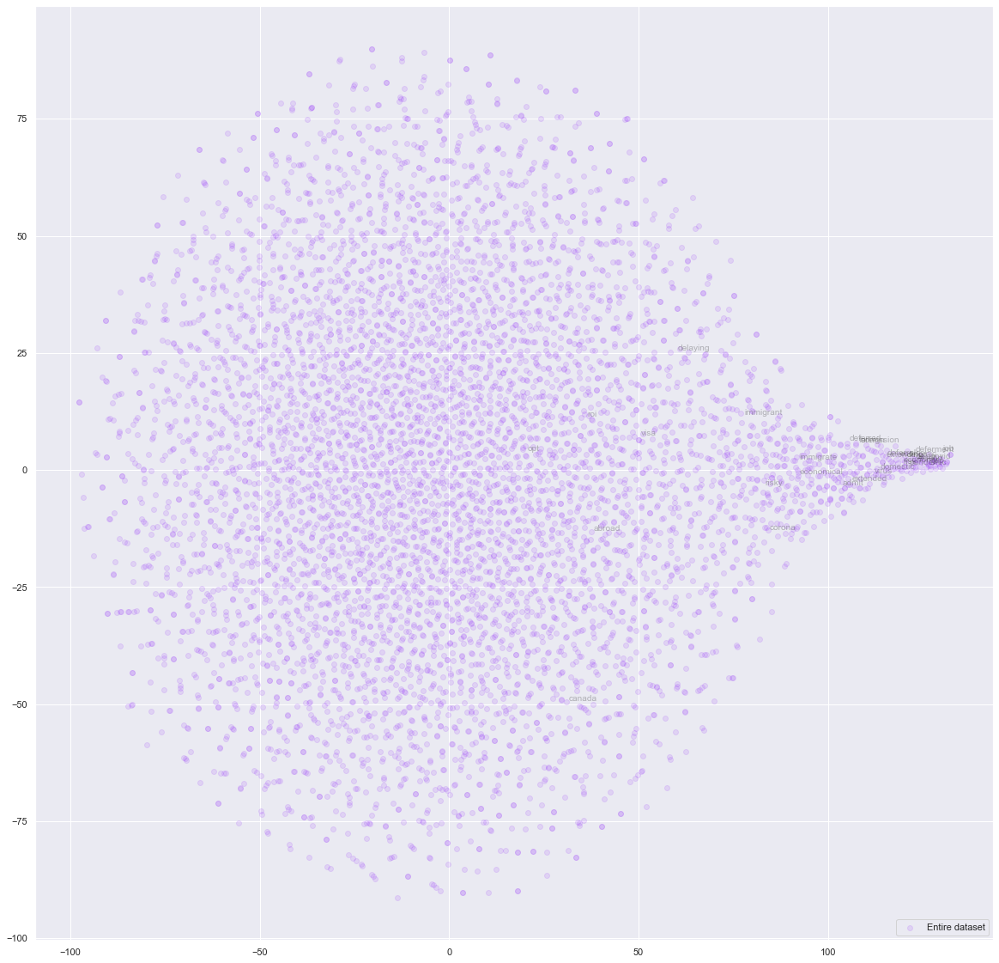

In [80]:
#prepare_for_w2v('data/Anna Karenina by Leo Tolstoy (ru).txt', 'train_anna_karenina_ru.txt', 'russian')
#model_ak = train_word2vec('train_anna_karenina_ru.txt')

# words_ak = []
# embeddings_ak = []
# for word in list(model.wv.vocab):
#     embeddings_ak.append(model.wv[word])
#     words_ak.append(word)
    
# tsne_ak_2d = TSNE(perplexity=30, n_components=2, init='pca', n_iter=3500, random_state=32)
# embeddings_ak_2d = tsne_ak_2d.fit_transform(embeddings_ak)

def tsne_plot_2d(label, embeddings, words=[], a=1):
    plt.figure(figsize=(20, 20))
    colors = cm.rainbow(np.linspace(0, 1, 1))
    x = embeddings[:,0]
    y = embeddings[:,1]
    plt.scatter(x, y, c=colors, alpha=a, label=label)
    for i, word in enumerate(words):
        plt.annotate(word, alpha=0.3, xy=(x[i], y[i]), xytext=(5, 2), 
                     textcoords='offset points', ha='right', va='bottom', size=10)
    plt.legend(loc=4)
    plt.grid(True)
    plt.savefig("entire dataset.png", format='png', dpi=150, bbox_inches='tight')
    plt.show()

tsne_plot_2d('Entire dataset', embeddings_ak_2d, words, a=0.1)

C:\Users\saksh\Anaconda3\lib\site-packages\matplotlib\collections.py:857: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


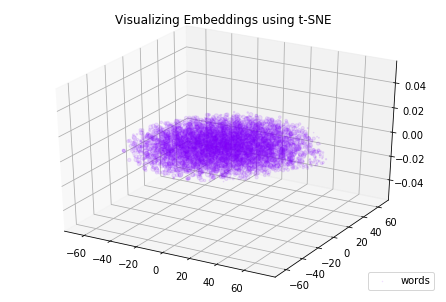

In [295]:
#prepare_for_w2v('data/War and Peace by Leo Tolstoy (ru).txt', 'train_war_and_peace_ru.txt', 'russian')
#model_wp = train_word2vec('train_war_and_peace_ru.txt')

words_wp = []
embeddings_wp = []
for word in list(model.wv.vocab):
    embeddings_wp.append(model.wv[word])
    words_wp.append(word)
    
tsne_wp_3d = TSNE(perplexity=30, n_components=3, init='pca', n_iter=3500, random_state=12)
embeddings_wp_3d = tsne_wp_3d.fit_transform(embeddings_wp)

from mpl_toolkits.mplot3d import Axes3D


def tsne_plot_3d(title, label, embeddings, a=1):
    fig = plt.figure()
    ax = Axes3D(fig)
    colors = cm.rainbow(np.linspace(0, 1, 1))
    plt.scatter(embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], c=colors, alpha=a, label=label)
    plt.legend(loc=4)
    plt.title(title)
    plt.show()


tsne_plot_3d('Visualizing Embeddings using t-SNE', 'words', embeddings_wp_3d, a=0.1)


In [16]:
#sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
words_wp = []
embeddings_wp = []
for word in list(model.wv.vocab):
    embeddings_wp.append(model.wv[word])
    words_wp.append(word)
    
tsne_wp_3d = TSNE(perplexity=30, n_components=2, init='pca', n_iter=3500, random_state=12)
embeddings_wp_3d = tsne_wp_3d.fit_transform(embeddings_wp)
embeddings_wp_3d 

array([[132.50609  ,  -7.819979 ],
       [ 90.87209  ,   6.6070695],
       [116.93595  ,  -6.508196 ],
       ...,
       [ 57.221912 ,   9.533676 ],
       [ 46.444443 ,  16.74404  ],
       [-39.87155  ,  31.069534 ]], dtype=float32)

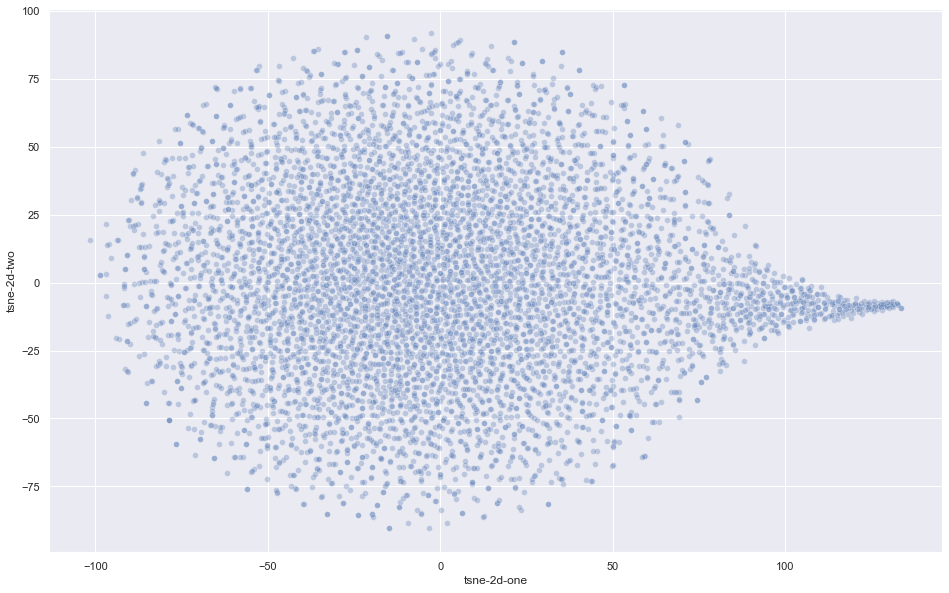

In [25]:
df_subset = pd.DataFrame()
df_subset['tsne-2d-one'] = embeddings_wp_3d[:,0]
df_subset['tsne-2d-two'] = embeddings_wp_3d[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    #hue=y,
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

In [40]:
x = embeddings_wp_3d[:, 0]
y = embeddings_wp_3d[:, 1]
plt.figure(figsize=(16,10))
plt.scatter(x, y, c=sns.color_palette("hls", 6310), alpha=0.7, label=words_wp)
# for i, word in enumerate(words_wp):
#     plt.annotate(word, alpha=0.5, xy=(x[i], y[i]), xytext=(5, 2),
#                  textcoords='offset points', ha='right', va='bottom', size=8)
plt.legend(loc=4)
plt.title("Word Embedding")
plt.grid(True)

ValueError: Image size of 279701x591 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1152x720 with 1 Axes>

In [35]:
len(words_wp)

6310

In [48]:
#import matplotlib.pyplot as plt
#import matplotlib.cm as cm
#% matplotlib inline


def tsne_plot_similar_words(title, labels, embedding_clusters, word_clusters, a, filename=None):
    plt.figure(figsize=(16, 9))
    colors = cm.rainbow(np.linspace(0, 1, len(labels)))
    for label, embeddings, words, color in zip(labels, embedding_clusters, word_clusters, colors):
        x = embeddings[:, 0]
        y = embeddings[:, 1]
        plt.scatter(x, y, c=color, alpha=a, label=label)
        for i, word in enumerate(words):
            plt.annotate(word, alpha=0.5, xy=(x[i], y[i]), xytext=(5, 2),
                         textcoords='offset points', ha='right', va='bottom', size=8)
    plt.legend(loc=4)
    plt.title(title)
    plt.grid(True)
    if filename:
        plt.savefig(filename, format='png', dpi=150, bbox_inches='tight')
    plt.show()


tsne_plot_similar_words('Similar words', words, embeddings_wp_3d, word_clusters, 0.7,'similar_words1.png')

IndexError: too many indices for array

<Figure size 1152x648 with 0 Axes>

In [46]:
embeddings_wp_3d

array([[132.50609  ,  -7.819979 ],
       [ 90.87209  ,   6.6070695],
       [116.93595  ,  -6.508196 ],
       ...,
       [ 57.221912 ,   9.533676 ],
       [ 46.444443 ,  16.74404  ],
       [-39.87155  ,  31.069534 ]], dtype=float32)

In [55]:
word_cluster

,covid,corona,virus,pandemic,admission,immigrant,immigrate,admit,job,risk,...,economic,economical,roi,defer,deferment,deferral,deferred,visa,opt,canada
0,resume,glad,string,hasan,school,since,rapid,hour,school,consulting,...,dental,valued,cal,unethical,guardian,forged,invite,ample,school,level
1,dream,prevention,employee,wright,essay,working,congress,point,essay,question,...,often,harmful,domain,search,specify,grit,senator,eligible,essay,woman
2,first,nancy,safari,wrong,work,personal,heart,long,may,even,...,certain,humanoid,tale,expand,ban,submission,thorough,build,may,much
3,answer,birthday,relatable,plot,applicant,want,south,done,work,card,...,project,publish,prior,jamboree,attachment,mix,debt,pause,job,mean
4,look,scary,weighing,muscle,experience,consulting,insurer,much,applicant,working,...,weekend,campus,entering,brutal,reopen,crystal,booking,television,applicant,understand
5,top,guarantee,donate,effective,year,looking,acting,want,year,make,...,ward,suicide,ann,lurker,wear,forecast,plan,temporary,work,applicant
6,mock,intention,picture,historic,goal,even,ripe,time,experience,work,...,hence,rethink,unanswered,graph,billed,indigenous,rolling,worked,help,want
7,name,diagnosis,emotional,predict,job,card,stability,interview,opt,part,...,prince,prevent,come,hear,moving,relaxed,answer,career,year,school
8,help,direct,inflation,thousand,may,good,describe,understand,good,personal,...,resilient,cosigner,next,assessment,gifted,still,synthesize,intuit,experience,made
9,applicant,wound,sent,rainbow,good,apply,excellency,business,goal,green,...,contact,emergent,science,digital,sailing,scientist,fall,currently,looking,process


In [56]:
list(word_cluster)

['covid',
 'corona',
 'virus',
 'pandemic',
 'admission',
 'immigrant',
 'immigrate',
 'admit',
 'job',
 'risk',
 'risky',
 'economy',
 'economic',
 'economical',
 'roi',
 'defer',
 'deferment',
 'deferral',
 'deferred',
 'visa',
 'opt',
 'canada']

In [57]:
word_clusters

[['resume',
  'glad',
  'string',
  'hasan',
  'school',
  'since',
  'rapid',
  'hour',
  'school',
  'consulting',
  'absurd',
  'talking',
  'dental',
  'valued',
  'cal',
  'unethical',
  'guardian',
  'forged',
  'invite',
  'ample',
  'school',
  'level'],
 ['dream',
  'prevention',
  'employee',
  'wright',
  'essay',
  'working',
  'congress',
  'point',
  'essay',
  'question',
  'execute',
  'recording',
  'often',
  'harmful',
  'domain',
  'search',
  'specify',
  'grit',
  'senator',
  'eligible',
  'essay',
  'woman'],
 ['first',
  'nancy',
  'safari',
  'wrong',
  'work',
  'personal',
  'heart',
  'long',
  'may',
  'even',
  'undertake',
  'disposal',
  'certain',
  'humanoid',
  'tale',
  'expand',
  'ban',
  'submission',
  'thorough',
  'build',
  'may',
  'much'],
 ['answer',
  'birthday',
  'relatable',
  'plot',
  'applicant',
  'want',
  'south',
  'done',
  'work',
  'card',
  'admirable',
  'chi',
  'project',
  'publish',
  'prior',
  'jamboree',
  'attachmen